In [1]:
import dask.dataframe as dd
import matplotlib.pyplot as plt
import os

In [2]:
import multiprocessing
from dask.distributed import Client, LocalCluster

# Get the number of available CPU cores
n_cores = multiprocessing.cpu_count()-1

cluster = LocalCluster(n_workers=n_cores, threads_per_worker=1)
client = Client(cluster)

In [3]:
folders = [
    'train0_25',
    'train25_50',
    'train50_75',
    'train75_100'
]

# Read Parquet files from each folder into Dask DataFrames
dfs = [dd.read_parquet(folder) for folder in folders]

# Concatenate all DataFrames into a single DataFrame
data = dd.concat(dfs)

In [ ]:
data.shape[0].compute()

In [4]:
numPartitions = data.npartitions
splitPart = int(numPartitions*0.7)
train = data.partitions[0:splitPart]
test = data.partitions[splitPart:numPartitions]

In [5]:
feat60 = ['state_t', 'state_q0001','state_q0002','state_q0003','state_u','state_v','pbuf_ozone','pbuf_CH4','pbuf_N2O']

feat60 = ['state_q0001','state_q0002','state_q0003','state_u','state_v','pbuf_ozone','pbuf_CH4','pbuf_N2O']
feat1 = ['state_ps','pbuf_SOLIN','pbuf_LHFLX','pbuf_SHFLX','pbuf_TAUX','pbuf_TAUY','pbuf_COSZRS','cam_in_ALDIF','cam_in_ALDIR','cam_in_ASDIF','cam_in_ASDIR','cam_in_LWUP','cam_in_ICEFRAC','cam_in_LANDFRAC','cam_in_OCNFRAC','cam_in_SNOWHLAND']

target60 = ['ptend_t','ptend_q0001','ptend_q0002','ptend_q0003','ptend_u','ptend_v']
target1 = ['cam_out_NETSW','cam_out_FLWDS','cam_out_PRECSC','cam_out_PRECC','cam_out_SOLS','cam_out_SOLL','cam_out_SOLSD','cam_out_SOLLD']

features60 = [] 
for f in feat60:
    features60 = features60 + [f+'_'+str(i) for i in range(60)]
allF = features60 + feat1

targets60 = [] 
for f in target60:
    targets60 = targets60 + [f+'_'+str(i) for i in range(60)]
allT = targets60 + target1

targetsToDrop12 = [ 'ptend_q0001', 'ptend_q0002', 'ptend_q0003', 'ptend_u', 'ptend_v']
dropT = ['ptend_q0002_12','ptend_q0002_13','ptend_q0002_14'] # attention, I think i also need to predict _15
for f in targetsToDrop12:
    dropT = dropT + [f+'_'+str(i) for i in range(12)]

allT2 = [i for i in allT if i not in dropT]

# find corrupt files

In [ ]:
import os
import dask.dataframe as dd
from dask.distributed import Client

# Optionally, start a Dask client for better error handling and performance
client = Client()

def find_parquet_files(folder):
    """Recursively find all parquet files in a given folder."""
    parquet_files = []
    for root, _, files in os.walk(folder):
        for file in files:
            if file.endswith(".parquet"):
                parquet_files.append(os.path.join(root, file))
    return parquet_files

# Collect all Parquet files from all folders
all_parquet_files = []
all_parquet_files.extend(find_parquet_files(folders[3]))

corrupted_files = []

# Attempt to read each Parquet file individually
for file in all_parquet_files:
    try:
        df = dd.read_parquet(file)
        # Force computation to check for any reading issues
        df.head()
    except Exception as e:
        print(f"Error reading {file}: {e}")
        corrupted_files.append(file)

if corrupted_files:
    print("The following files are corrupted or not Parquet files:")
    for corrupted_file in corrupted_files:
        print(corrupted_file)
else:
    print("No corrupted files found.")


In [ ]:
len(corrupted_files)

In [ ]:
import os

for file in corrupted_files:
    os.remove(file)


# check out data

In [ ]:
import logging

In [ ]:
logging.getLogger("distributed.utils_perf").setLevel(logging.ERROR)
data['ptend_q0002_15'].compute().hist(bins=100)

# visualize data
- all variables seem to be somewhat stationary -> no time dependency in data
- we can just downsample data

In [6]:
def createHistPlt(a, f,st):
    if not os.path.exists('histplots/'+f+st+'.jpg'):
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))   

        # Histogram
        ax1.hist(a, bins=100, edgecolor='k', alpha=0.7)
        #ax1.set_xlabel(f)
        ax1.set_ylabel('Frequency')
        ax1.set_title('Histogram of '+f)    

        # Time Series
        ax2.scatter(a.index, a, s=1, alpha=0.7)
        ax2.set_xlabel('index')
        ax2.set_ylabel(f)
        m = a.mean()
        s = a.std()
        ax2.set_title('mean'+str(round(m,2)) + ' std '+str(round(s,2)))

        # Adjust layout
        #plt.tight_layout()
        #plt.show()
        fig.savefig('histplots/'+f+st+'.jpg')
    else:
        print('skipped',f)
def createHist(a,f,st):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))   
    ax1.hist(a, bins=100, edgecolor='k', alpha=0.7)
    #ax1.set_xlabel(f)
    ax1.set_ylabel('Frequency')
    ax1.set_title('Histogram of '+f)  
    m = a.mean()
    s = a.std()
    b = (a - a.mean())/a.std()
    ax2.hist(a, bins=100, edgecolor='k', alpha=0.7)
    ax2.set_xlabel(f)
    ax2.set_ylabel('Frequency')
    ax2.set_title('mean'+str(round(m,2)) + ' std '+str(round(s,2)))
    fig.savefig('histplots/'+f+st+'.jpg')

2024-05-29 13:36:31,125 - distributed.worker.memory - WARNING - Worker is at 85% memory usage. Pausing worker.  Process memory: 0.98 GiB -- Worker memory limit: 1.14 GiB
2024-05-29 13:36:31,216 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 0.98 GiB -- Worker memory limit: 1.14 GiB
2024-05-29 13:36:31,336 - distributed.worker.memory - WARNING - Worker is at 65% memory usage. Resuming worker. Process memory: 768.20 MiB -- Worker memory limit: 1.14 GiB
2024-05-29 13:36:38,527 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged me

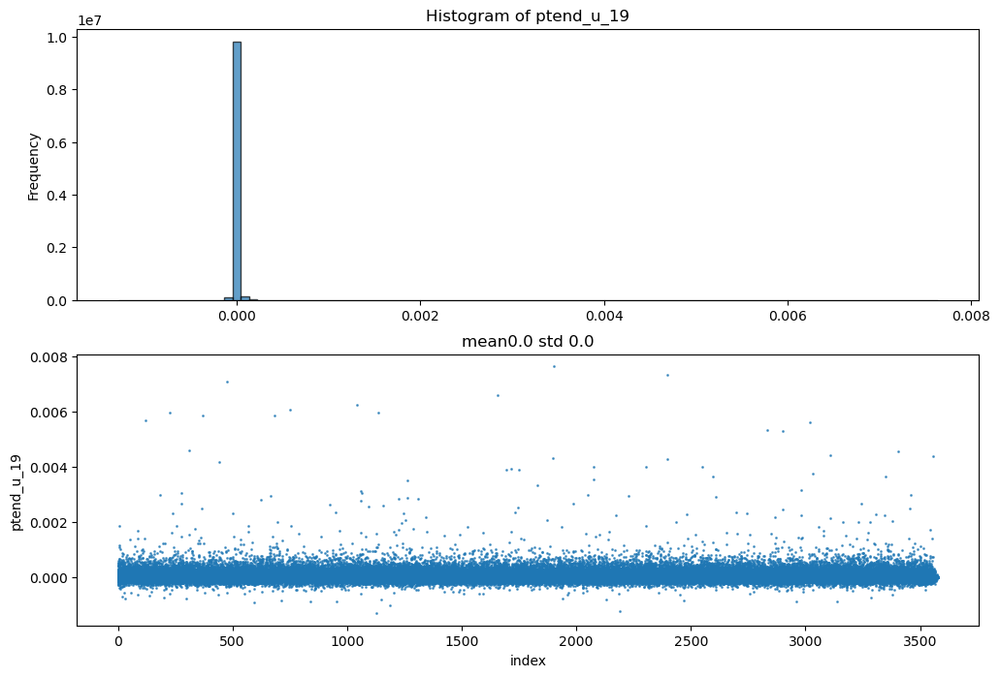

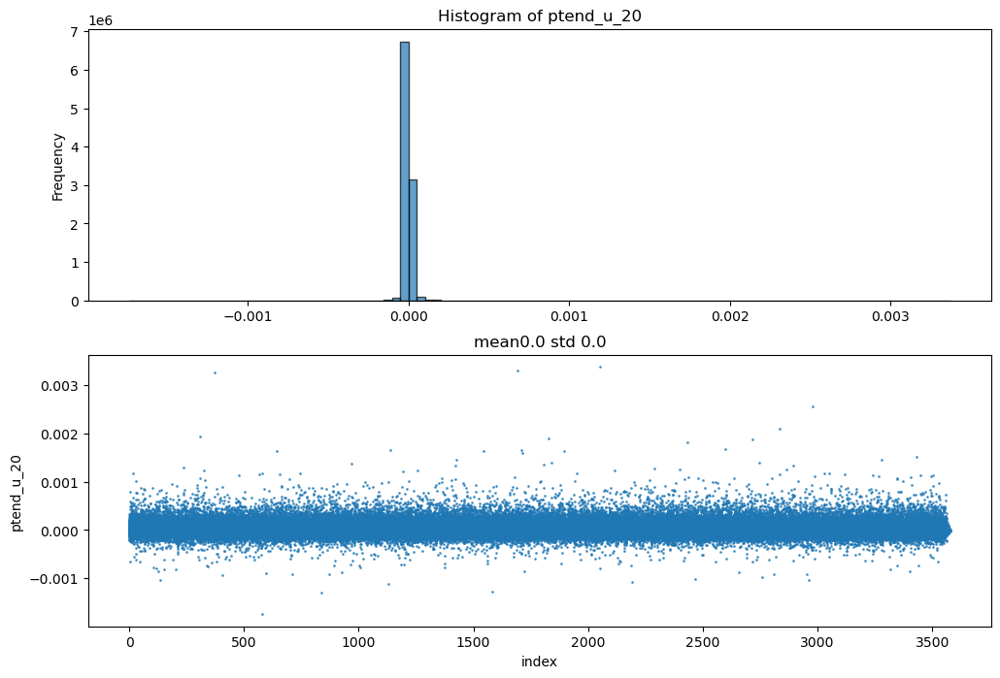

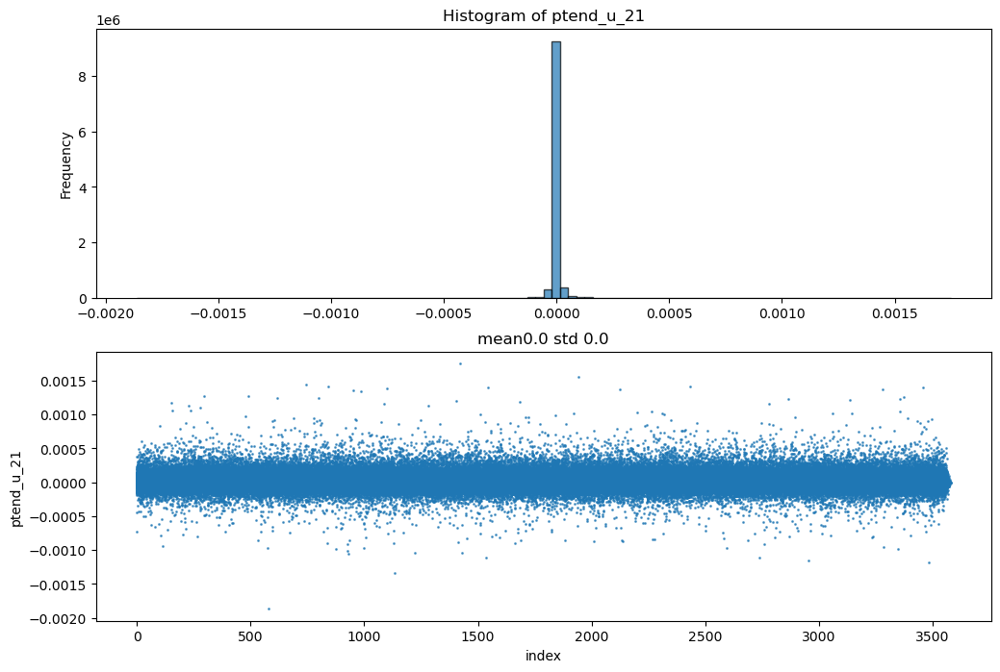

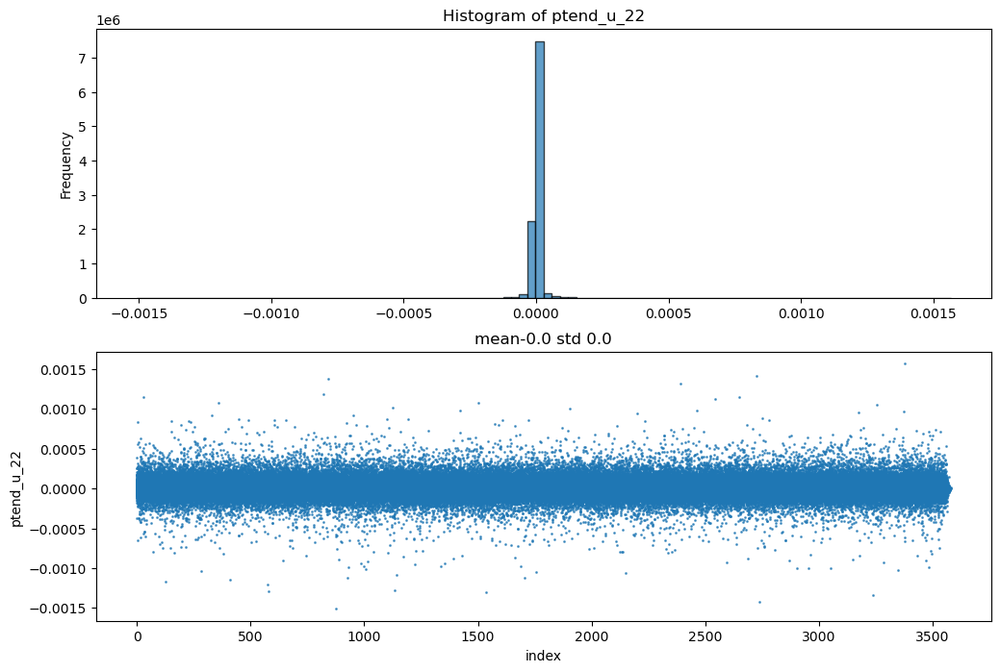

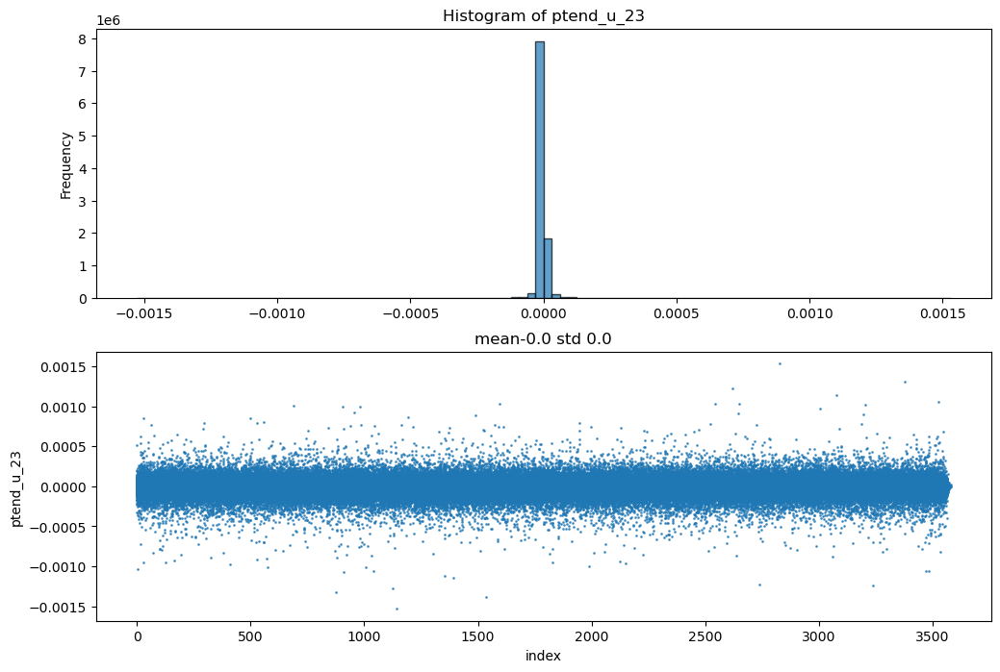

...

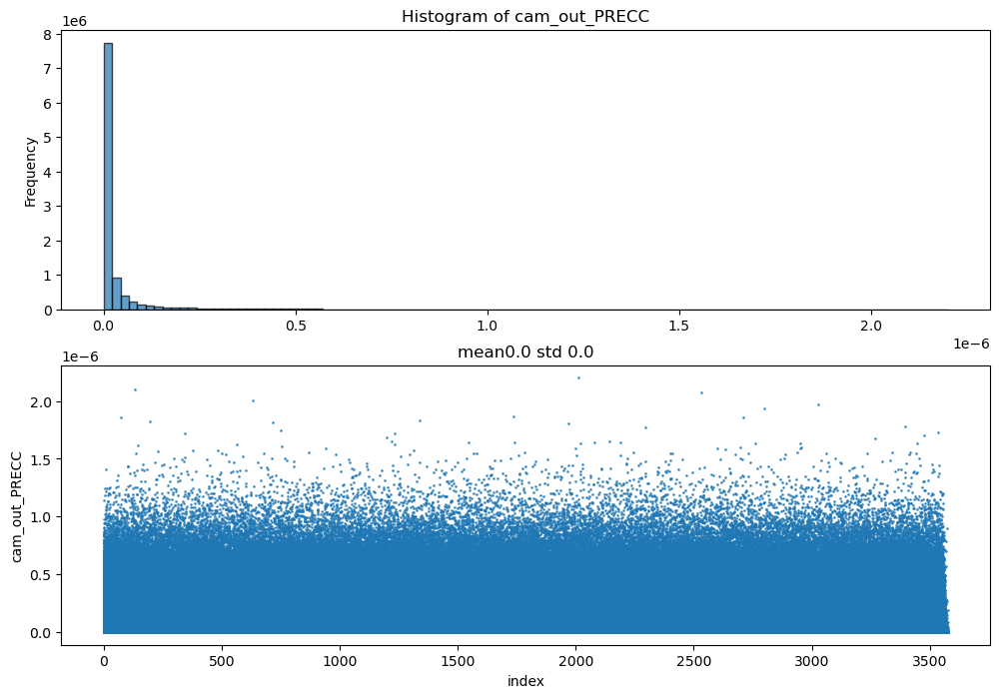

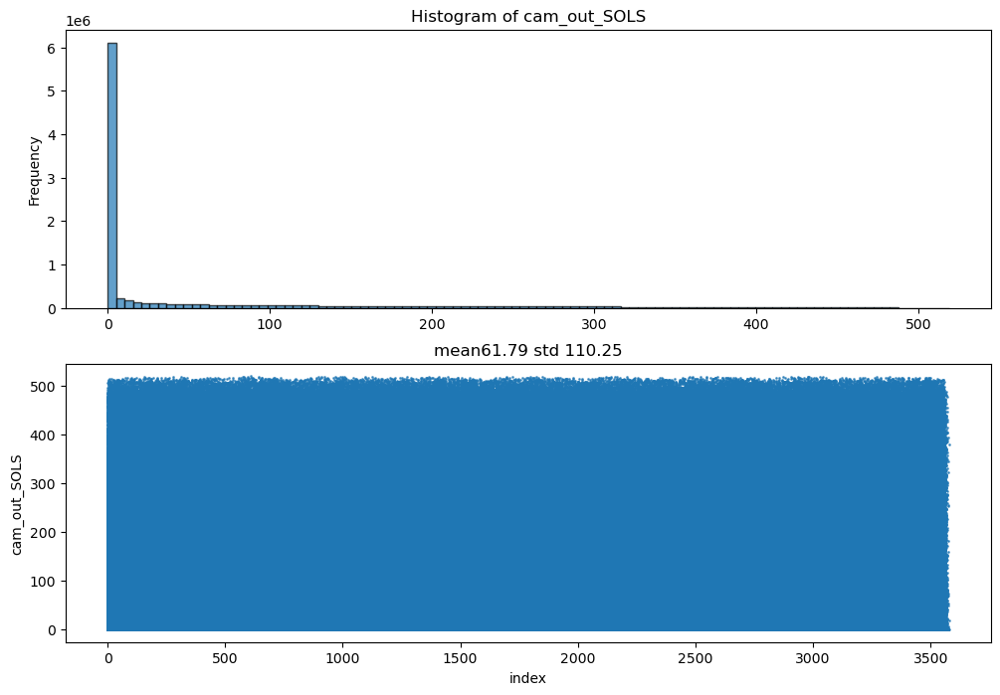

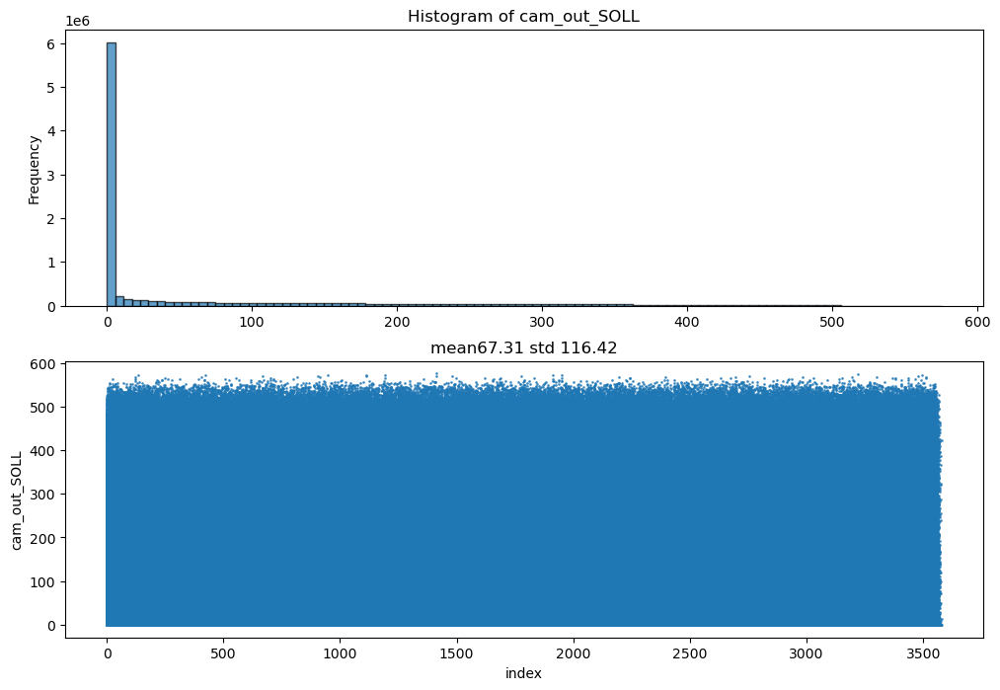

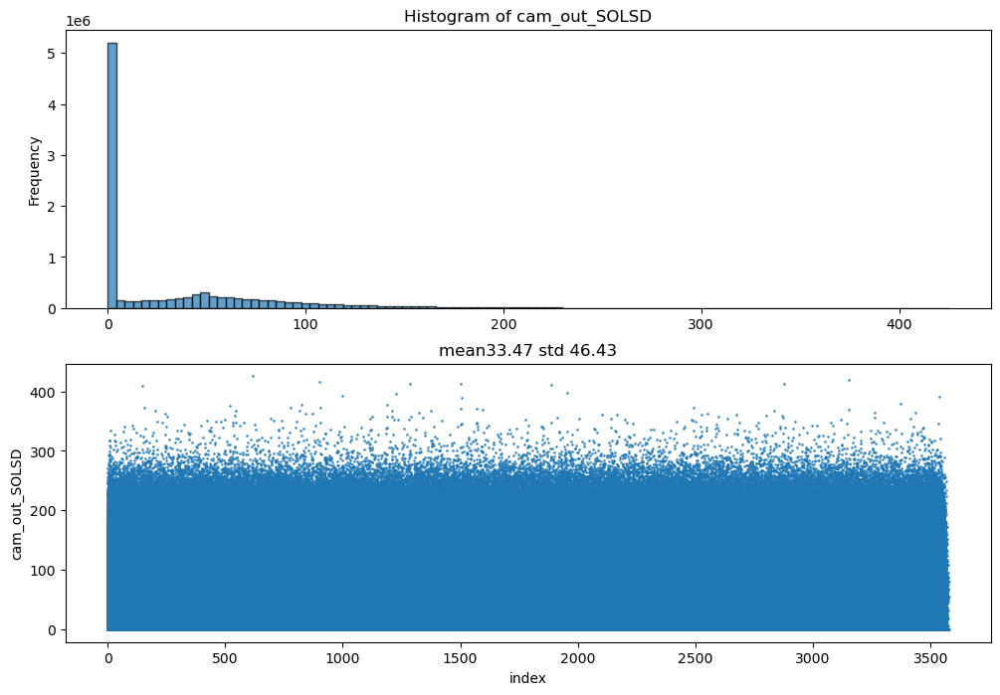

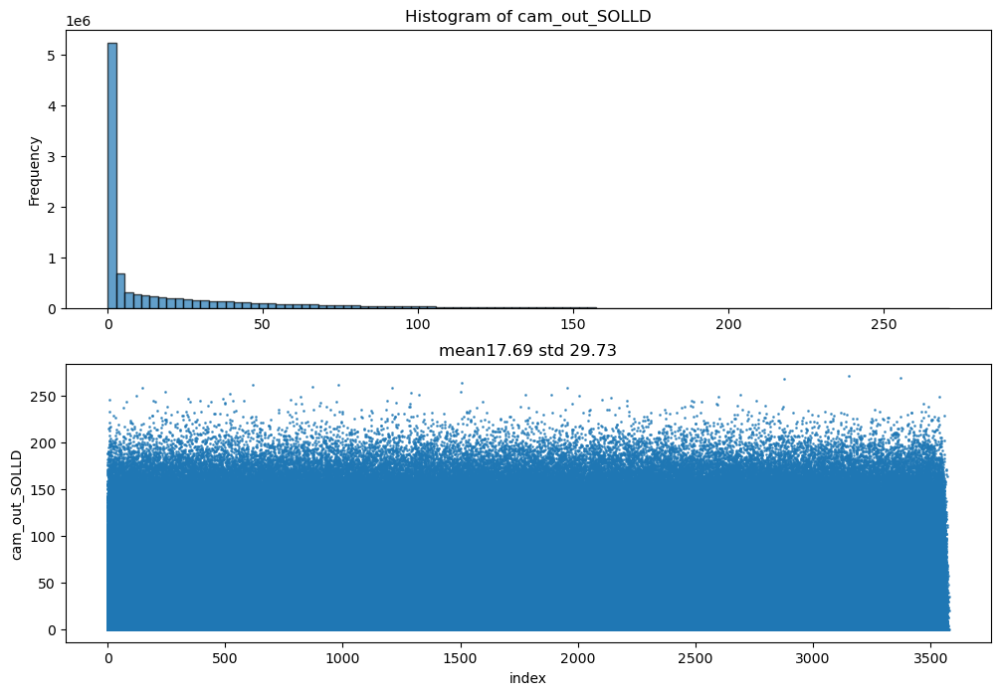

In [7]:
# temperature: distribution moves from left to right
for f in allF:
    if not os.path.exists('histplots/'+f+'feat'+'.jpg'):
        a = data[f].compute()
        createHistPlt(a,f, 'feat')
for f in allT2:
    if not os.path.exists('histplots/'+f+'targ'+'.jpg'):
        a = data[f].compute()
        createHistPlt(a,f, 'targ')

# downsample data

# baseline approach (LGBM)

In [ ]:
mean_values = {}
for i,f in enumerate(allF + allT):
    if i<10:
        print(f)
    mean_values[f] = train[f].mean().compute()

In [ ]:
std_values = train[(allF+allT)].std().compute()